In [60]:
import pandas as pd
import numpy as np


In [61]:
df = pd.read_csv('/content/drive/MyDrive/pickup.csv')

In [62]:
df.head()

,order_id,region_id,city,courier_id,accept_time,time_window_start,time_window_end,lng,lat,aoi_id,...,pickup_time,pickup_gps_time,pickup_gps_lng,pickup_gps_lat,accept_gps_time,accept_gps_lng,accept_gps_lat,ds,ETA_pickup,ETA_pickup_hours
0,2301722,3,Chongqing,4706,2023-10-09 13:57:00,2023-10-09 13:57:00,2023-10-09 15:57:00,106.46869,29.47191,218,...,2023-10-09 15:53:00,2023-10-09 15:53:00,106.46821,29.46771,2023-10-09 13:56:00,106.46929,29.47231,1009.0,0 days 01:56:00,1.933333
1,780972,3,Chongqing,4706,2023-05-22 10:22:00,2023-05-22 10:22:00,2023-05-22 12:22:00,106.46875,29.47208,218,...,2023-05-22 11:18:00,2023-05-22 11:17:00,106.46930,29.47238,2023-05-22 10:22:00,106.47907,29.43180,522.0,0 days 00:56:00,0.933333
2,283833,3,Chongqing,6693,2023-05-03 07:49:00,2023-05-03 17:00:00,2023-05-03 19:00:00,106.46863,29.47203,218,...,2023-05-03 18:44:00,2023-05-03 18:44:00,106.47037,29.47237,2023-05-03 07:49:00,106.49162,29.43503,503.0,0 days 10:55:00,10.916667
3,4315552,3,Chongqing,317,2023-06-06 10:49:00,2023-06-06 11:00:00,2023-06-06 13:00:00,106.46861,29.48829,337,...,2023-06-06 12:13:00,2023-06-06 12:13:00,106.46860,29.48788,2023-06-06 10:49:00,106.47521,29.48561,606.0,0 days 01:24:00,1.400000
4,728111,3,Chongqing,317,2023-05-21 09:06:00,2023-05-21 11:00:00,2023-05-21 13:00:00,106.46772,29.48808,337,...,2023-05-21 14:36:00,2023-05-21 14:36:00,106.46918,29.48724,2023-05-21 09:06:00,106.46635,29.49159,521.0,0 days 05:30:00,5.500000


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2965386 entries, 0 to 2965385
Data columns (total 21 columns):
 #   Column             Dtype  
---  ------             -----  
 0   order_id           int64  
 1   region_id          int64  
 2   city               object 
 3   courier_id         int64  
 4   accept_time        object 
 5   time_window_start  object 
 6   time_window_end    object 
 7   lng                float64
 8   lat                float64
 9   aoi_id             int64  
 10  aoi_type           int64  
 11  pickup_time        object 
 12  pickup_gps_time    object 
 13  pickup_gps_lng     float64
 14  pickup_gps_lat     float64
 15  accept_gps_time    object 
 16  accept_gps_lng     float64
 17  accept_gps_lat     float64
 18  ds                 float64
 19  ETA_pickup         object 
 20  ETA_pickup_hours   float64
dtypes: float64(8), int64(5), object(8)
memory usage: 475.1+ MB


In [64]:
df.isnull().sum()

,0
order_id,0
region_id,0
city,0
courier_id,0
accept_time,0
time_window_start,0
time_window_end,0
lng,0
lat,0
aoi_id,0


In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2965386 entries, 0 to 2965385
Data columns (total 21 columns):
 #   Column             Dtype  
---  ------             -----  
 0   order_id           int64  
 1   region_id          int64  
 2   city               object 
 3   courier_id         int64  
 4   accept_time        object 
 5   time_window_start  object 
 6   time_window_end    object 
 7   lng                float64
 8   lat                float64
 9   aoi_id             int64  
 10  aoi_type           int64  
 11  pickup_time        object 
 12  pickup_gps_time    object 
 13  pickup_gps_lng     float64
 14  pickup_gps_lat     float64
 15  accept_gps_time    object 
 16  accept_gps_lng     float64
 17  accept_gps_lat     float64
 18  ds                 float64
 19  ETA_pickup         object 
 20  ETA_pickup_hours   float64
dtypes: float64(8), int64(5), object(8)
memory usage: 475.1+ MB


In [66]:
timestamp_col = ['accept_gps_time','pickup_gps_time','time_window_start','time_window_end','accept_time','pickup_time']
for col in timestamp_col:
  df[col] = pd.to_datetime(df[col],format = '%Y-%m-%d %H:%M:%S',errors='coerce')

In [67]:
df[timestamp_col].head()

,accept_gps_time,pickup_gps_time,time_window_start,time_window_end,accept_time,pickup_time
0,2023-10-09 13:56:00,2023-10-09 15:53:00,2023-10-09 13:57:00,2023-10-09 15:57:00,2023-10-09 13:57:00,2023-10-09 15:53:00
1,2023-05-22 10:22:00,2023-05-22 11:17:00,2023-05-22 10:22:00,2023-05-22 12:22:00,2023-05-22 10:22:00,2023-05-22 11:18:00
2,2023-05-03 07:49:00,2023-05-03 18:44:00,2023-05-03 17:00:00,2023-05-03 19:00:00,2023-05-03 07:49:00,2023-05-03 18:44:00
3,2023-06-06 10:49:00,2023-06-06 12:13:00,2023-06-06 11:00:00,2023-06-06 13:00:00,2023-06-06 10:49:00,2023-06-06 12:13:00
4,2023-05-21 09:06:00,2023-05-21 14:36:00,2023-05-21 11:00:00,2023-05-21 13:00:00,2023-05-21 09:06:00,2023-05-21 14:36:00


In [68]:
threshold = 0.9

numerical_col = df.select_dtypes(include=['number']).columns
corr_mertrix = df[numerical_col].corr()

#find high corelated dmn
highly_corelated = []
for i in range(len(corr_mertrix.columns)):
  for j in range(i+1,len(corr_mertrix.columns)):
    if abs(corr_mertrix.iloc[i,j] > threshold):
      colname_i = corr_mertrix.columns[i]
      colname_j = corr_mertrix.columns[j]
      highly_corelated.append((colname_i,colname_j))


#highly corelated Features
highly_corelated

[('lng', 'pickup_gps_lng'),
 ('lng', 'accept_gps_lng'),
 ('lat', 'pickup_gps_lat'),
 ('lat', 'accept_gps_lat'),
 ('pickup_gps_lng', 'accept_gps_lng'),
 ('pickup_gps_lat', 'accept_gps_lat')]

In [69]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df,features):
  vif_data = pd.DataFrame()
  vif_data['features'] = features
  vif_data['VIF'] = [variance_inflation_factor(df[features].values,i) for i in range(len(features))]

  return vif_data


vif_df = calculate_vif(df,numerical_col)

vif_threshold = 5

features_remove = vif_df[vif_df['VIF'] > vif_threshold]

print(features_remove)


          features           VIF
1        region_id  6.251027e+00
3              lng  6.017172e+06
4              lat  7.108958e+05
7   pickup_gps_lng  7.055491e+06
8   pickup_gps_lat  9.495315e+05
9   accept_gps_lng  5.252349e+06
10  accept_gps_lat  8.721148e+05
11              ds  2.395797e+01


In [70]:
import numpy as np

def haversine_distance(lat1, lon1, lat2, lon2):

  #radius of earth
  R = 6371

  lat1, lon1, lat2, lon2 = np.radians([lat1, lon1, lat2, lon2])

  dlat = lat2 - lat1
  dlon = lon2 - lon1
  a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
  c = 2 * np.arcsin(np.sqrt(a))
  distance = R*c

  return distance


df['pickup_distance_km'] = df.apply(lambda row: haversine_distance( row['accept_gps_lat'],row['accept_gps_lng'],row['pickup_gps_lat'], row['pickup_gps_lng']),axis=1)

In [71]:
df['pickup_distance_km']

df['pickup_location_sum'] = df['lat'] + df['lng']

In [72]:
df['pickup_day'] = df['pickup_time'].dt.day
df['pickup_hour'] = df['pickup_time'].dt.hour

df['accept_time_day'] = df['accept_time'].dt.day
df['accept_time_hour'] = df['accept_time'].dt.hour


df['pickup_day_of_week'] = df['pickup_time'].dt.dayofweek
df['pickuptime_is_weekend'] = df['pickup_day_of_week'].isin([5,6]).astype(int)

df['accept_day_of_week'] = df['accept_time'].dt.dayofweek
df['accepttime_is_weekend'] = df['accept_day_of_week'].isin([5,6]).astype(int)

In [73]:
#detect outliers using stats model

from scipy import stats

def detect_outliers(df,column,threshold):


  z = np.abs(stats.zscore(df[column]))
  outlier_indices = np.where(z > threshold)[0]
  return outlier_indices

for column in numerical_col:
  outlier_indices = detect_outliers(df,column,3)
  print(f"outliers in {column} : {outlier_indices}")




outliers in order_id : []
outliers in region_id : []
outliers in courier_id : []
outliers in lng : []
outliers in lat : []
outliers in aoi_id : []
outliers in aoi_type : []
outliers in pickup_gps_lng : []
outliers in pickup_gps_lat : [  89665 1080040 2582702]
outliers in accept_gps_lng : []
outliers in accept_gps_lat : [1080040 2569614 2576281]
outliers in ds : []
outliers in ETA_pickup_hours : [      2      67      86 ... 2965264 2965313 2965334]


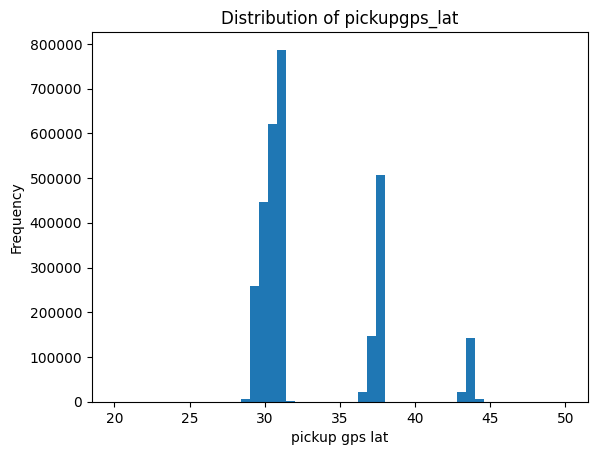

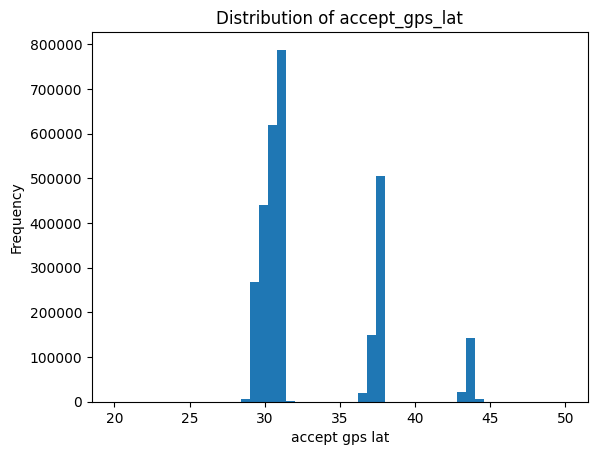

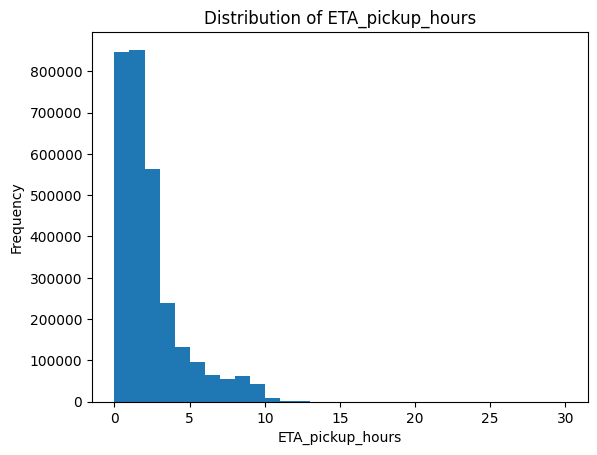

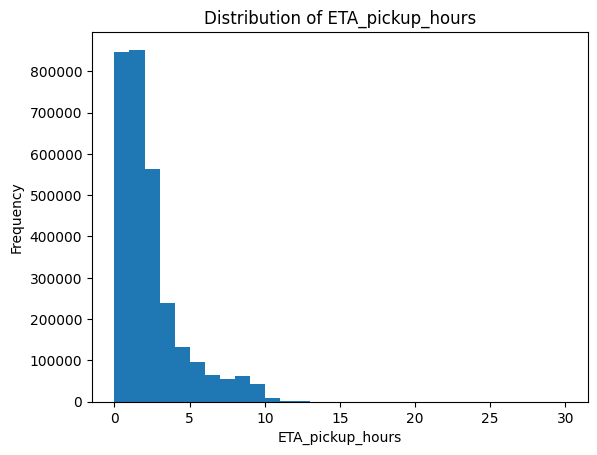

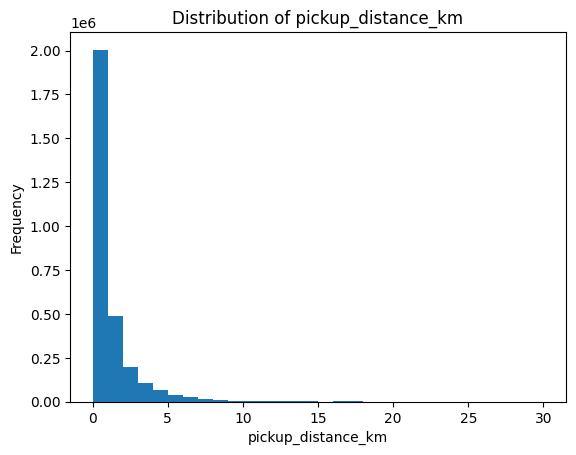

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.hist(df['pickup_gps_lat'],range=(20,50),bins=50)
plt.xlabel('pickup gps lat')
plt.ylabel('Frequency')
plt.title('Distribution of pickupgps_lat')
plt.show()



plt.hist(df['accept_gps_lat'],range=(20,50),bins=50)
plt.xlabel('accept gps lat')
plt.ylabel('Frequency')
plt.title('Distribution of accept_gps_lat')
plt.show()

plt.hist(df['ETA_pickup_hours'],range=(0,30),bins=30)
plt.xlabel('ETA_pickup_hours')
plt.ylabel('Frequency')
plt.title('Distribution of ETA_pickup_hours')
plt.show()


plt.hist(df['ETA_pickup_hours'],range=(0,30),bins=30)
plt.xlabel('ETA_pickup_hours')
plt.ylabel('Frequency')
plt.title('Distribution of ETA_pickup_hours')
plt.show()






plt.hist(df['pickup_distance_km'],range=(0,30),bins=30)
plt.xlabel('pickup_distance_km')
plt.ylabel('Frequency')
plt.title('Distribution of pickup_distance_km')
plt.show()









In [75]:

#outliers using Quantile

def detect_outliers_iqr(df,column):
  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)
  IQR = Q3-Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  outlier_indices = df[(df[column] < lower_bound) | (df[column] > upper_bound )].index.tolist()
  return outlier_indices

for column in numerical_col:
  outlier_indices = detect_outliers_iqr(df,column)
  print(f"outliers in {column} : {outlier_indices}")



outliers in order_id : []
outliers in region_id : []
outliers in courier_id : []
outliers in lng : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 

In [ ]:
sns.boxplot(x=df['ETA_pickup_hours'])



In [ ]:
drop_time_col = ['time_window_start','time_window_end','accept_time','pickup_time','ETA_pickup','accept_gps_time','pickup_gps_time']


In [ ]:
#remove time columns from dataset  bcz we derived useful info.
df.drop(drop_time_col,axis=1,inplace=True)


In [79]:
df.columns

Index(['order_id', 'region_id', 'city', 'courier_id', 'lng', 'lat', 'aoi_id',
       'aoi_type', 'pickup_gps_lng', 'pickup_gps_lat', 'accept_gps_lng',
       'accept_gps_lat', 'ds', 'ETA_pickup_hours', 'pickup_distance_km',
       'pickup_location_sum', 'pickup_day', 'pickup_hour', 'accept_time_day',
       'accept_time_hour', 'pickup_day_of_week', 'pickuptime_is_weekend',
       'accept_day_of_week', 'accepttime_is_weekend'],
      dtype='object')

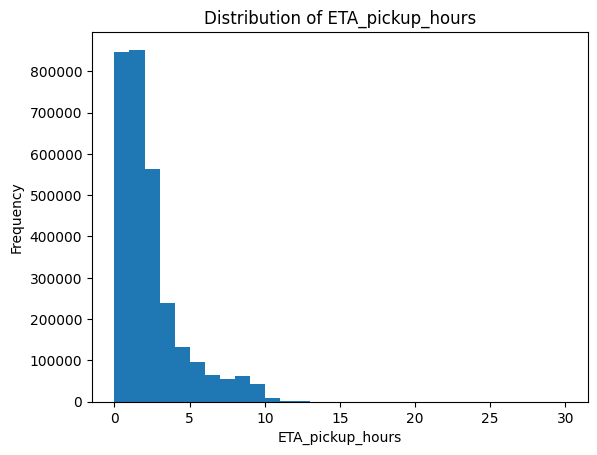

In [80]:
plt.hist(df['ETA_pickup_hours'],range=(0,30),bins=30)
plt.xlabel('ETA_pickup_hours')
plt.ylabel('Frequency')
plt.title('Distribution of ETA_pickup_hours')
plt.show()

In [81]:
upper_limit = df['ETA_pickup_hours'].quantile(0.99)
lower_limit = df['ETA_pickup_hours'].quantile(0.01)

In [82]:
print(lower_limit)
print(upper_limit)
df.shape


0.05
9.45


(2965386, 24)

In [83]:
new_df = df[(df['ETA_pickup_hours'] <= upper_limit) & df['ETA_pickup_hours'] >= lower_limit]

In [84]:
new_df.head(5)

,order_id,region_id,city,courier_id,lng,lat,aoi_id,aoi_type,pickup_gps_lng,pickup_gps_lat,...,pickup_distance_km,pickup_location_sum,pickup_day,pickup_hour,accept_time_day,accept_time_hour,pickup_day_of_week,pickuptime_is_weekend,accept_day_of_week,accepttime_is_weekend
0,2301722,3,Chongqing,4706,106.46869,29.47191,218,14,106.46821,29.46771,...,0.522073,135.94060,9,15,9,13,0,0,0,0
1,780972,3,Chongqing,4706,106.46875,29.47208,218,14,106.46930,29.47238,...,4.610384,135.94083,22,11,22,10,0,0,0,0
3,4315552,3,Chongqing,317,106.46861,29.48829,337,1,106.46860,29.48788,...,0.687785,135.95690,6,12,6,10,1,0,1,0
4,728111,3,Chongqing,317,106.46772,29.48808,337,1,106.46918,29.48724,...,0.555871,135.95580,21,14,21,9,6,1,6,1
5,1935925,3,Chongqing,317,106.46885,29.48818,337,1,106.46925,29.48795,...,0.230941,135.95703,28,11,28,9,6,1,6,1


<Axes: xlabel='ETA_pickup_hours'>

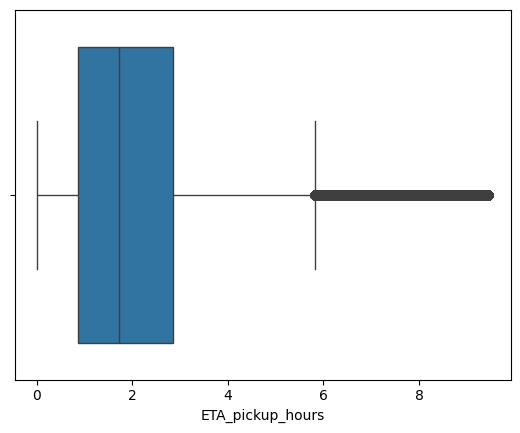

In [85]:
sns.boxplot(x=new_df['ETA_pickup_hours'])

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

sample_df = df.sample(n=5000, random_state=42)

x_sample = sample_df.drop('ETA_pickup_hours',axis=1)
x_sample = x_sample.select_dtypes(include=['int32','int64','float64'])
y_sample = sample_df['ETA_pickup_hours']

X_train,X_test,y_train,y_test = train_test_split(x_sample,y_sample,test_size=0.2,random_state=42)




#using random forest for feastures importance
model = RandomForestRegressor(n_estimators=100,random_state=42)
model.fit(X_train,y_train)


In [ ]:
#important Features
features_importance = model.feature_importances_

# Create a DataFrame for visualization
importance_df = pd.DataFrame({'Feature': x_sample.columns, 'Importance': features_importance})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

import matplotlib.pyplot as plt

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.title('Feature Importance using Random Forest')
plt.gca().invert_yaxis()
plt.show()


In [115]:
low_importance_features = importance_df[importance_df['Importance'] < 0.004]['Feature']
low_importance_features

,Feature
0,order_id
5,aoi_id
2,courier_id
11,ds
1,region_id
13,pickup_location_sum
7,pickup_gps_lng
16,accept_time_day
14,pickup_day
9,accept_gps_lng


In [ ]:
df.drop(low_importance_features,axis=1,inplace=True)


In [90]:
x = df.drop('ETA_pickup_hours',axis=1)
x.shape
cols = x.columns

In [91]:
y = df['ETA_pickup_hours']
df.head()

,city,ETA_pickup_hours,pickup_distance_km,pickup_hour,accept_time_hour
0,Chongqing,1.933333,0.522073,15,13
1,Chongqing,0.933333,4.610384,11,10
2,Chongqing,10.916667,4.633848,18,7
3,Chongqing,1.400000,0.687785,12,10
4,Chongqing,5.500000,0.555871,14,9


In [92]:
#derived fetures

df['time_diff'] = df['pickup_hour'] - y


# Display updated dataset
print("Newly Created Features for Delivery:", ['location_sum_delivery','time_diff'])
print("Updated Dataset Shape:", df.shape)



Newly Created Features for Delivery: ['location_sum_delivery', 'time_diff']
Updated Dataset Shape: (2965386, 6)


In [93]:
numerical_features = df.select_dtypes(include=['int32','int64','float64'])
datetime_features = df.select_dtypes(exclude=['int32','int64','float64'])

from sklearn.preprocessing import StandardScaler
pickup_numeric_cols = ['pickup_hour', 'ETA_pickup_hours', 'lng', 'lat', 'region_id']
datetime_col = datetime_features.columns
df.drop(datetime_col,axis=1,inplace=True)
df.head()

,ETA_pickup_hours,pickup_distance_km,pickup_hour,accept_time_hour,time_diff
0,1.933333,0.522073,15,13,13.066667
1,0.933333,4.610384,11,10,10.066667
2,10.916667,4.633848,18,7,7.083333
3,1.400000,0.687785,12,10,10.600000
4,5.500000,0.555871,14,9,8.500000


In [94]:
y = numerical_features['ETA_pickup_hours']
numerical_features.drop('ETA_pickup_hours',axis=1,inplace=True)

In [95]:
from sklearn.preprocessing import StandardScaler
pickup_numeric_cols = ['pickup_hour', 'ETA_pickup_hours', 'lng', 'lat', 'region_id']
datetime_col = datetime_features.columns

scaler = StandardScaler()
numerical_features = scaler.fit_transform(numerical_features)

numerical_features

array([[-0.1094927 ,  0.93168375,  1.12072112,  1.14024007],
       [ 0.49467885, -0.43408295,  0.02074984,  0.04164066],
       [ 0.49814642,  1.95600878, -1.07922144, -1.05085543],
       ...,
       [-0.18428509, -1.45840798, -0.71256434, -0.95930548],
       [-0.16234635, -0.43408295,  0.02074984,  0.11488062],
       [-0.04383745, -0.43408295,  0.02074984,  0.17591392]])

In [96]:
numerical_features.shape

(2965386, 4)

In [97]:
x_df = pd.DataFrame(numerical_features,columns=cols)
x_df.head()

,city,pickup_distance_km,pickup_hour,accept_time_hour
0,-0.109493,0.931684,1.120721,1.140240
1,0.494679,-0.434083,0.020750,0.041641
2,0.498146,1.956009,-1.079221,-1.050855
3,-0.085004,-0.092641,0.020750,0.236947
4,-0.104498,0.590242,-0.345907,-0.532072


In [98]:
from sklearn.decomposition import PCA


pca = PCA(n_components=0.95)

#pca for all Columns
principle_components = pca.fit_transform(x_df)

In [ ]:
principle_components.shape

In [100]:
pickup_pca = pd.DataFrame(data=principle_components,columns=['pc1','pc12','pc13'])
pickup_pca.head()

,pc1,pc12,pc13
0,1.852780,-0.008791,-0.056309
1,-0.219300,0.478038,-0.397758
2,-0.268302,0.517531,2.450055
3,0.110208,-0.081362,-0.171276
4,-0.208069,-0.104869,0.828533


In [101]:
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


x_train,x_test,y_train,y_test = train_test_split(pickup_pca,y,test_size=0.2,random_state=42)
lr = LinearRegression()


In [102]:
lr.fit(x_train,y_train)
lr.score(x_test,y_test)
y_pred = lr.predict(x_test)

In [103]:
mae = mean_squared_error(y_test,y_pred)
mae

0.046068522103385405

In [104]:
r2 = r2_score(y_test,y_pred)
r2

0.9896951531165905

In [105]:
lr.score(x_test,y_test)

0.9896951531165905

In [106]:
xgmodel = XGBRegressor()
xgmodel.fit(x_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
xgmodel.score(x_test,y_test)

In [ ]:
pred = xgmodel.predict(x_test)

In [ ]:
xg_mae = mean_squared_error(y_test,pred)
xg_mae

In [ ]:
xg_r2 = r2_score(y_test,pred)
xg_r2